## This google colab notebook introduces basic Image Processing Methods such as Image Histogram, Intensity Transformation, Thresholding and Filtering. Use the following drive link to access the images.
https://drive.google.com/open?id=1QC910Yh70rkaUm9B3fLEJQRQMCbNkw9h


## Mounting the google drive and loading requried libraries

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import plotly
from skimage import io
from skimage import morphology as morp
import plotly.express as px
import plotly.graph_objects as go
from skimage import morphology as morp
from skimage.morphology import disk, dilation

## Various ways of reading images

In [118]:
ls

aman2.jpeg              coca.jpg            j.png         rose.jpeg
aman3.jpeg              coins.jpg           lena.png      salt_noise.png
aman.jpeg               cubes.png           lotus.jpg     stadium.jpg
bell.jpg                face_alignment.jpg  maggie2.jpg   sudoku.jpeg
boy_smiling.jpg         face.jpg            maggie3.jpeg  text2.png
chair.png               FingerPrint.jpg     maggie.jpg    text.jpg
chroma_img.jpg          gamma1.jpg          objects.png   window.jpeg
chroma_keying_demo.png  gamma2.jpg          overlaid.png


In [4]:
cd drive/My Drive/Image Processing

/content/drive/My Drive/Image Processing


(512, 512, 3)


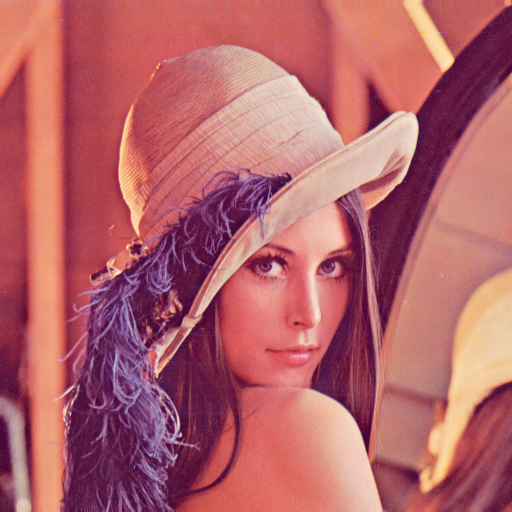

In [9]:
#Lena and it's dimensions
I=cv2.imread('./lena.png')
print(I.shape)
cv2_imshow(I)


(137, 137, 3)


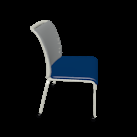

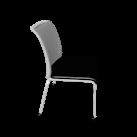

In [10]:
#my code
I = cv2.imread('./chair.png')
print (I.shape)
cv2_imshow(I)
cv2_imshow(I[:,:,2])

(137, 137, 4)


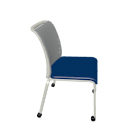

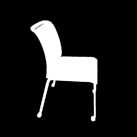

In [12]:
#my code
I = cv2.imread('./chair.png',cv2.IMREAD_UNCHANGED)
print(I.shape)
cv2_imshow(I)
cv2_imshow(I[:,:,3])

(137, 137)


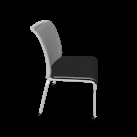

In [18]:
#my code
I = cv2.imread('./chair.png',cv2.IMREAD_GRAYSCALE)
print (I.shape)
cv2_imshow(I)
counts,bins = np.histogram(I.ravel(),256,[0,256])

In [26]:
I = io.imread('./chair.png')
print (I.shape)
a,b,c=I.shape
a
b
# c

(137, 137, 4)


137

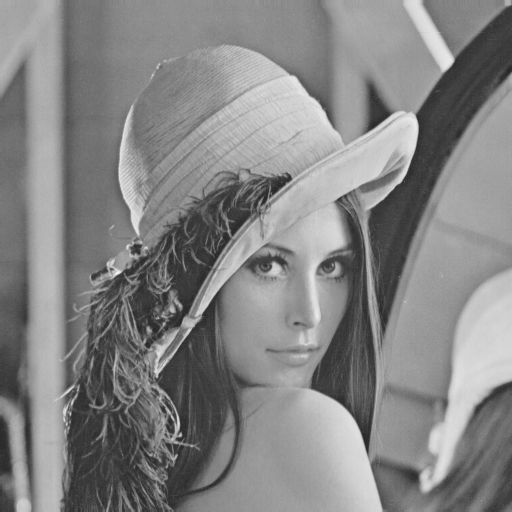

(512, 512)


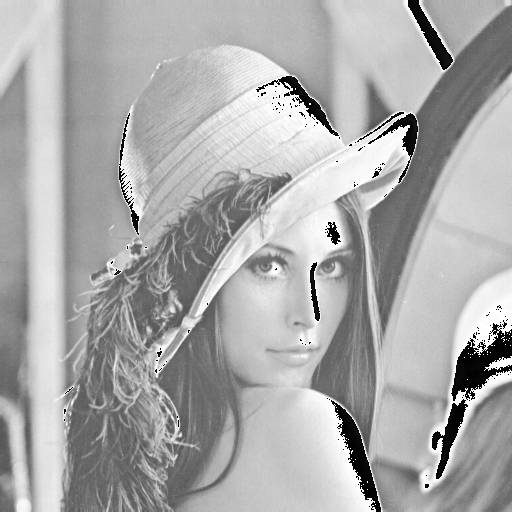

In [42]:
def it(x):
  a,b=x.shape
  # a=-1
  for i in range(a):
    for j in range(b):
     x[i][j]=x[i][j]+45
    #  if(x[i][j]>=255):
      #  x[i][j]=255
    #  x[i][j]=x[i][j]/255
  return x
I= cv2.imread('./lena.png',cv2.IMREAD_GRAYSCALE)
cv2_imshow(I)
print(I.shape)
B = it(I)
cv2_imshow(B)

In [118]:
I_lena_bw = cv2.imread('./lena.png', cv2.IMREAD_GRAYSCALE)
print (I_lena_bw.dtype)
counts,bins = np.histogram(I.ravel(),256,[0,256])
print(bins)
bins = 0.5 * (bins[:-1] + bins[1:])
print(counts)
print(bins)
fig = px.bar(x=bins, y=counts,labels={'x':'Pixel Value', 'y':'Frequency'},title='Image Histogram')
fig.show()


uint8
[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.
  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.
  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.
  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.
  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.
  98.  99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111.
 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124. 125.
 126. 127. 128. 129. 130. 131. 132. 133. 134. 135. 136. 137. 138. 139.
 140. 141. 142. 143. 144. 145. 146. 147. 148. 149. 150. 151. 152. 153.
 154. 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165. 166. 167.
 168. 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180. 181.
 182. 183. 184. 185. 186. 187. 188. 189. 190. 191. 192. 193. 194. 195.


In [135]:
#histogram
I=I_lena_bw.flatten()
I.shape
array = np.zeros(256)
array2 = np.zeros(256)
for i in range(255):
  array[i]=i+0.5
for i in I:
  a=int(i)
  array2[a]=array2[a]+1
fig = px.bar(x=array, y=array2,labels={'x':'Pixel Value', 'y':'Frequency'},title='Image Histogram')
fig.show()

[  0.5   1.5   2.5   3.5   4.5   5.5   6.5   7.5   8.5   9.5  10.5  11.5
  12.5  13.5  14.5  15.5  16.5  17.5  18.5  19.5  20.5  21.5  22.5  23.5
  24.5  25.5  26.5  27.5  28.5  29.5  30.5  31.5  32.5  33.5  34.5  35.5
  36.5  37.5  38.5  39.5  40.5  41.5  42.5  43.5  44.5  45.5  46.5  47.5
  48.5  49.5  50.5  51.5  52.5  53.5  54.5  55.5  56.5  57.5  58.5  59.5
  60.5  61.5  62.5  63.5  64.5  65.5  66.5  67.5  68.5  69.5  70.5  71.5
  72.5  73.5  74.5  75.5  76.5  77.5  78.5  79.5  80.5  81.5  82.5  83.5
  84.5  85.5  86.5  87.5  88.5  89.5  90.5  91.5  92.5  93.5  94.5  95.5
  96.5  97.5  98.5  99.5 100.5 101.5 102.5 103.5 104.5 105.5 106.5 107.5
 108.5 109.5 110.5 111.5 112.5 113.5 114.5 115.5 116.5 117.5 118.5 119.5
 120.5 121.5 122.5 123.5 124.5 125.5 126.5 127.5 128.5 129.5 130.5 131.5
 132.5 133.5 134.5 135.5 136.5 137.5 138.5 139.5 140.5 141.5 142.5 143.5
 144.5 145.5 146.5 147.5 148.5 149.5 150.5 151.5 152.5 153.5 154.5 155.5
 156.5 157.5 158.5 159.5 160.5 161.5 162.5 163.5 16

##Function to return the histogram of image
##HW1: Write your own function instead of using np.histogram?

In [129]:
def return_histogram(I):
  if (len(I.shape) == 2 or I.shape[2] == 1):
    counts,bins = np.histogram(I.ravel(),256,[0,256])
    bins = 0.5 * (bins[:-1] + bins[1:])
    fig = px.bar(x=bins, y=counts, labels={'x':'Pixel Value', 'y':'Frequency'},title='Image Histogram')
  elif (I.shape[2] == 3):
    # Complete this part for RGB images.
    #histogram
    I=I.flatten()
    # a,b,c=I.shape
    array = np.zeros(256)
    array2 = np.zeros(256)
    for i in range(255):
      array[i]=i+0.5
    for i in I:
      a=int(i)
      array2[a]=array2[a]+1
    fig = px.bar(x=array, y=array2,labels={'x':'Pixel Value', 'y':'Frequency'},title='Image Histogram')
    # fig.show()
    pass
  return fig

I=cv2.imread('./lena.png')
print(I.shape)
fig=return_histogram(I)
fig.show()
I_lena_bw = cv2.imread('./gamma1.jpg', cv2.IMREAD_GRAYSCALE)
fig=return_histogram(I_lena_bw)
fig.show()

(512, 512, 3)


##Intensity Transformations

Is this the correct way to transform?

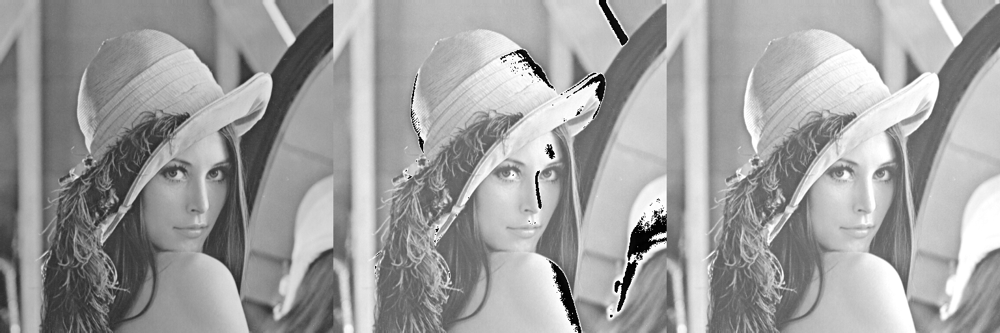

In [67]:
linearshift=45
lena1= I_lena_bw + linearshift
I = I_lena_bw.astype('int')
lena_shifted = np.clip((I+linearshift),0,255).astype('uint8')
cv2_imshow(np.hstack([I,lena1, lena_shifted]))

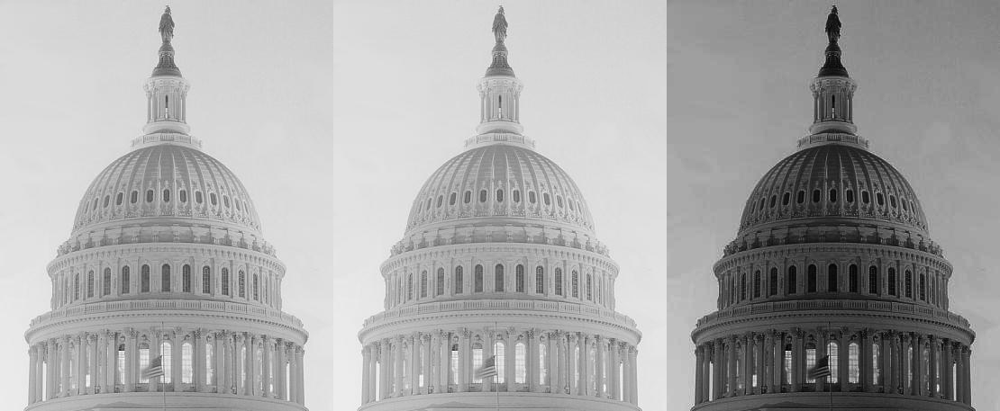

In [93]:

I_lena_bw = cv2.imread('./gamma1.jpg', cv2.IMREAD_GRAYSCALE)
I=I_lena_bw.astype('int')
I=I/255
I1=I**0.9
I2=I**3
I1=I1*255
I2=I2*255
I=I*255
I1=np.clip((I1),0,255).astype('uint8')
I2=np.clip((I2),0,255).astype('uint8')
cv2_imshow(np.hstack([I,I1,I2]))

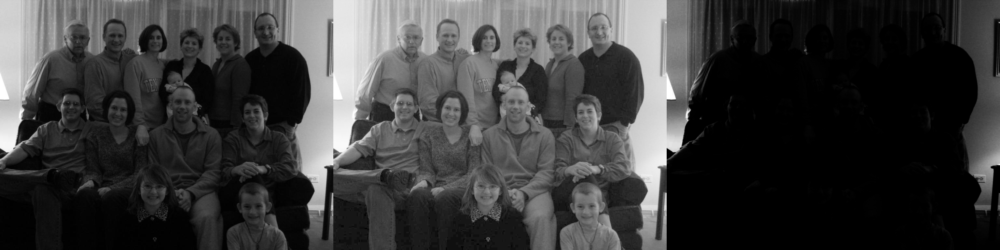

In [92]:

I_lena_bw = cv2.imread('./gamma2.jpg', cv2.IMREAD_GRAYSCALE)
I=I_lena_bw.astype('int')
I=I/255
I1=I**0.5
I2=I**3.5
I1=I1*255
I2=I2*255
I=I*255
I1=np.clip((I1),0,255).astype('uint8')
I2=np.clip((I2),0,255).astype('uint8')
cv2_imshow(np.hstack([I,I1,I2]))

In [0]:
linear_shift = 45
lena_shifted1 = I_lena_bw + linear_shift

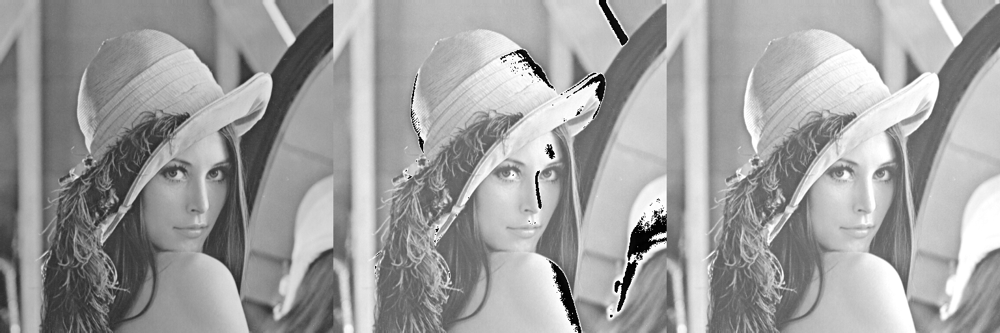

In [0]:
I = I_lena_bw.astype('int')
lena_shifted = np.clip((I + linear_shift),0,255).astype('uint8')
cv2_imshow(np.hstack([I,lena_shifted1, lena_shifted]))

# Plotting the Histogram
fig = go.Figure()
fig.add_trace(go.Histogram(x=I.ravel(), name= 'Original Image'))
fig.add_trace(go.Histogram(x=lena_shifted1.ravel(), name= 'Incorrect Transformation'))
fig.add_trace(go.Histogram(x=lena_shifted.ravel(), name= 'Correct Transformation'))
fig.show()

### **Ex1: Write code to perform gamma transformations for different values of gamma and plot the histograms.**
### **Report your observations.**

## Image Thresholding

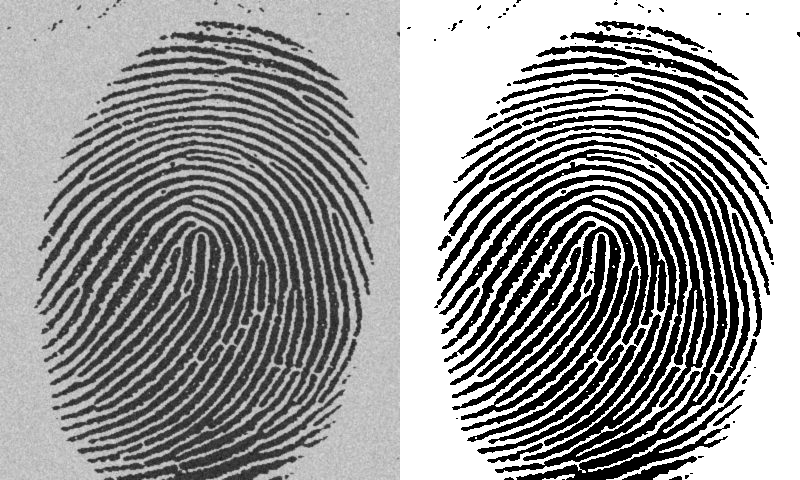

In [0]:
# Thresholding based on Histogram Values
I = cv2.imread('/content/drive/My Drive/Image Processing/FingerPrint.jpg', cv2.IMREAD_GRAYSCALE)
figure = return_histogram(I)
figure.show()
ret,thresh1 = cv2.threshold(I,125,255,cv2.THRESH_BINARY)
cv2_imshow(np.hstack([I, thresh1]))

(480, 400)


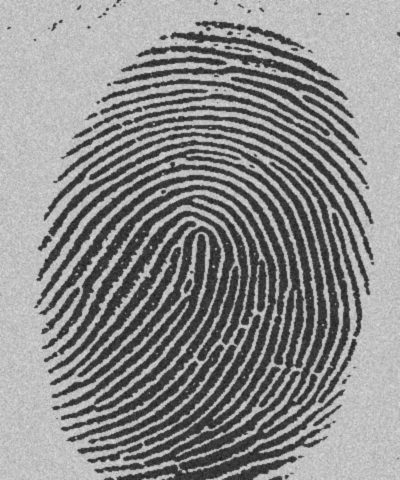

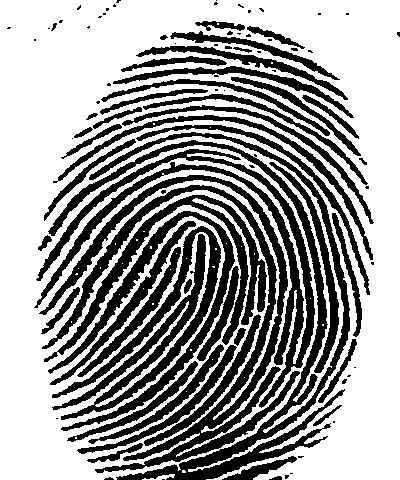

In [146]:
#thresholding
I = cv2.imread('./FingerPrint.jpg',cv2.IMREAD_GRAYSCALE)
print(I.shape)
cv2_imshow(I)
for i in range(480):
  for j in range(400):
    k=k+1
    if(I[i][j]<131):
      I[i][j]=0
    else:
      I[i][j]=255
cv2_imshow(I)

(423, 419)


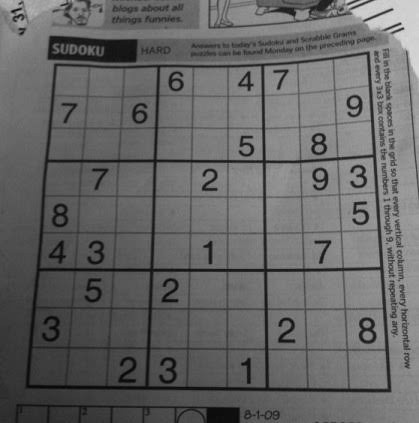

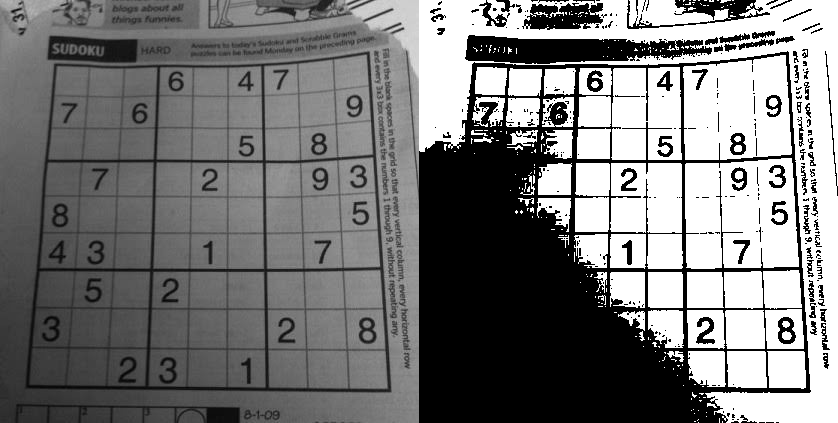

In [174]:
#thresholding
I = cv2.imread('./sudoku.jpeg',cv2.IMREAD_GRAYSCALE)
print(I.shape)
fig=return_histogram(I)
fig.show()
cv2_imshow(I)
a,b=I.shape
ret,thresh1 = cv2.threshold(I,100,255,cv2.THRESH_BINARY)
cv2_imshow(np.hstack([I,thresh1]))

(423, 419)


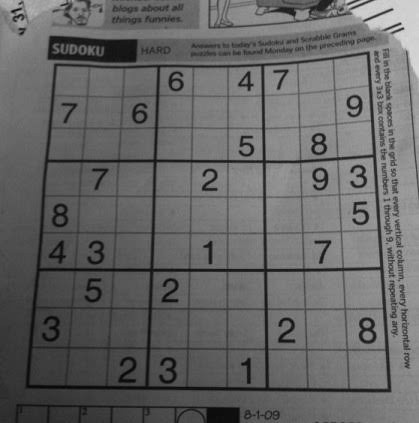

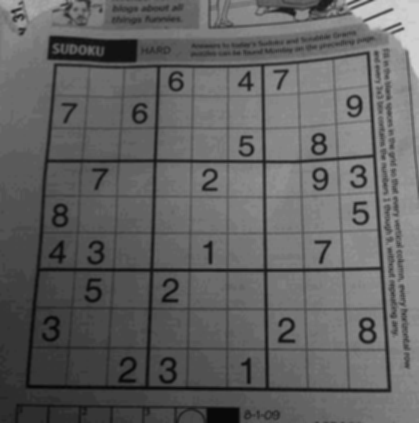

In [199]:
#conv with avg
def conv(I):
  a,b=I.shape
  Z=I.astype('uint8')
  for i in range(a):
    for j in range(b):
      Z[i][j]=0
      for d in range(3):
        for f in range(3):
          x=i+d-1
          y=j+f-1
          if(x<0):
            x=0
          if(y<0):
            y=0
          if(x>a-1):
            x=a-1
          if(y>b-1):
            y=b-1
          Z[i][j]=Z[i][j]+I[x][y]/9
      Z[i][j]=Z[i][j]
  return Z
I = cv2.imread('./sudoku.jpeg',cv2.IMREAD_GRAYSCALE)
I=I.astype('uint8')
print(I.shape)
cv2_imshow(I)
return_histogram(I).show()
K=conv(I)
cv2_imshow(K)
return_histogram(K).show()

In [0]:
#conv with avg
def conv(I):
  a,b=I.shape
  Z=I.astype('uint8')
  for i in range(a):
    for j in range(b):
      Z[i][j]=0
      for d in range(3):
        for f in range(3):
          x=i+d-1
          y=j+f-1
          if(x<0):
            x=0
          if(y<0):
            y=0
          if(x>a-1):
            x=a-1
          if(y>b-1):
            y=b-1
          if(a==1 and b==1):
            Z[i][j]=Z[i][j]+I[x][y]*5
          else:
            Z[i][j]=Z[i][j]+I[x][y]/9
      Z[i][j]=Z[i][j]
  return Z

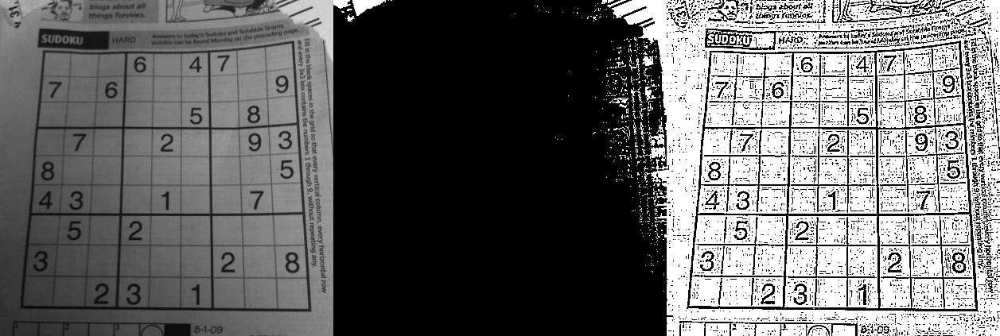

In [200]:
# Adaptive Thresholding
I = cv2.imread('/content/drive/My Drive/Image Processing/sudoku.jpeg', cv2.IMREAD_GRAYSCALE)
figure = return_histogram(I)
figure.show()
ret,thresh1 = cv2.threshold(I,150,255,cv2.THRESH_BINARY)
thresh2 = cv2.adaptiveThreshold(I,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,5,2)
cv2_imshow(np.hstack([I, thresh1, thresh2]))

In this case as we see global thresholding does not work. Hence we use adaptive thresholding where separate threshold is defined for each pixel based on the neighbouring window around it.
### HW2: Perform thresholding and try to retrieve the mask for the text in the image 'text.jpg'

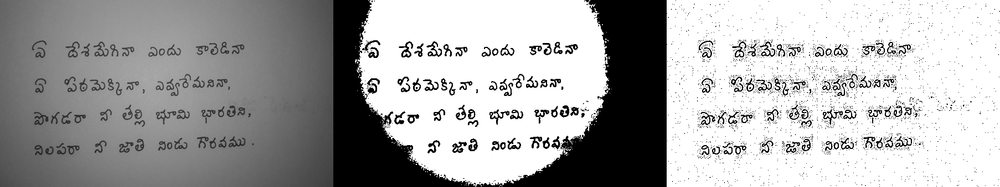

In [202]:
# Adaptive Thresholding
I = cv2.imread('./text.jpg', cv2.IMREAD_GRAYSCALE)
figure = return_histogram(I)
figure.show()
ret,thresh1 = cv2.threshold(I,120,255,cv2.THRESH_BINARY)
thresh2 = cv2.adaptiveThreshold(I,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,5,2)
cv2_imshow(np.hstack([I, thresh1, thresh2]))

## Image Filtering

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


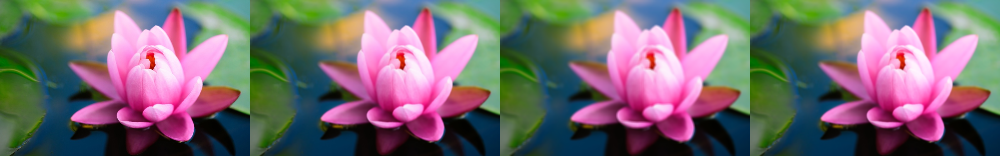

In [0]:
# Averaging or Smoothing Filter
I = cv2.imread('/content/drive/My Drive/Image Processing/lotus.jpg')

# Averaging Kernel of size (5,5)
kernel = np.ones((5,5),np.float32)/25
print (kernel)
filtered_image1 = cv2.filter2D(I,-1,kernel)

# Averaging Kernel of size (9,9)
filtered_image2 = cv2.blur(I,(9,9),0)
filtered_image3 = cv2.GaussianBlur(I,(9,9),0)


cv2_imshow(np.hstack([I, filtered_image1, filtered_image2,filtered_image3]))
# figure = return_histogram(I)
# figure.show()

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


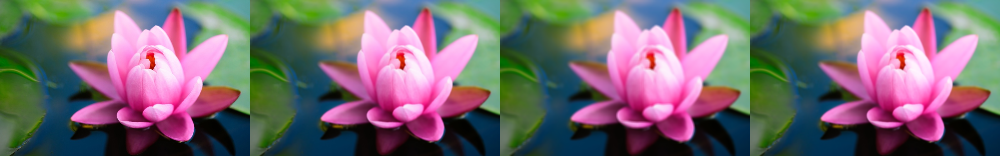

In [203]:
I = cv2.imread('./lotus.jpg')
kernel = np.ones((5,5),np.float32)/25
print(kernel)
filtered_image1= cv2.filter2D(I,-1,kernel)
filtered_image2 = cv2.blur(I,(9,9),0)
filtered_image3 = cv2.GaussianBlur(I,(9,9),0)

cv2_imshow(np.hstack([I,filtered_image1,filtered_image2,filtered_image3]))


## Ex 2: What will be the identity kernel?
## What happens if you repeatedly apply the Blurring Filter? Verify.

[[-1 -1 -1]
 [-1  9 -1]
 [-1 -1 -1]]


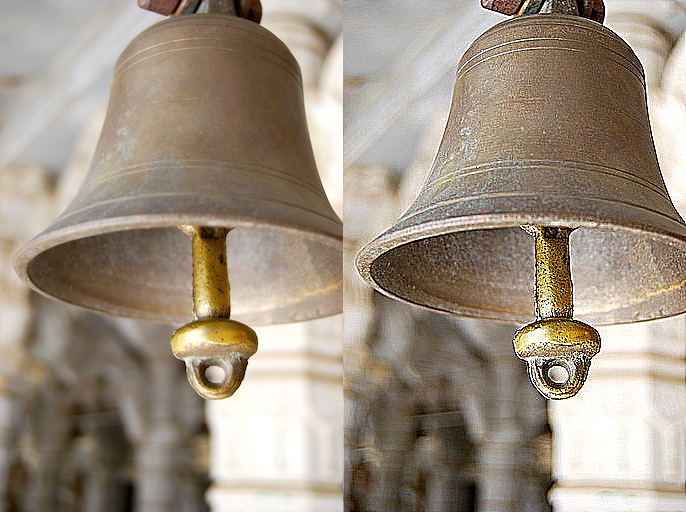

In [0]:
I = cv2.imread('/content/drive/My Drive/Image Processing/bell.jpg')
sharpening_kernel = np.array([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]])
print (sharpening_kernel)
sharpened_image = cv2.filter2D(I,-1,sharpening_kernel)
cv2_imshow(np.hstack([I, sharpened_image]))

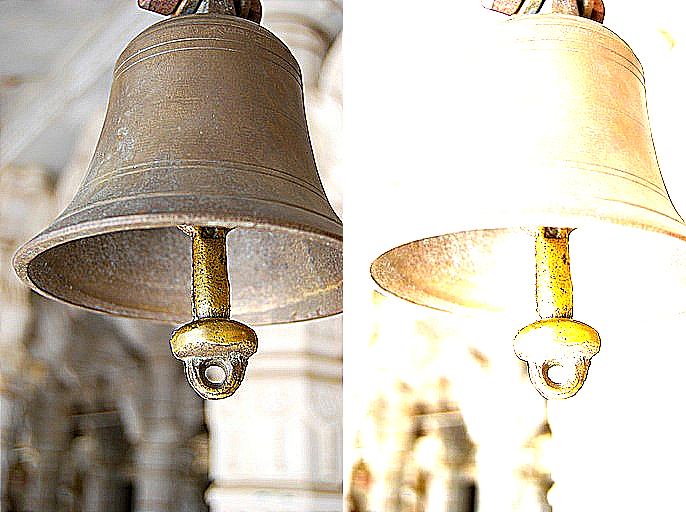

In [206]:
I = cv2.imread('./bell.jpg')
sharpen2= np.array([[-1,-1,-1],[-1,11,-1],[-1,-1,-1]])
sharpen1= np.array([[-1,-1,-1],[-1,9,-1],[-1,-1,-1]])
sharpened_image1= cv2.filter2D(I,-1,sharpen1)
sharpened_image2= cv2.filter2D(I,-1,sharpen2)
cv2_imshow(np.hstack([sharpened_image1,sharpened_image2]))

## Salt and Pepper Noise
Salt Noise is characterised by white pixels all over the image and pepper noise is characterised by black pixels spread over the image.




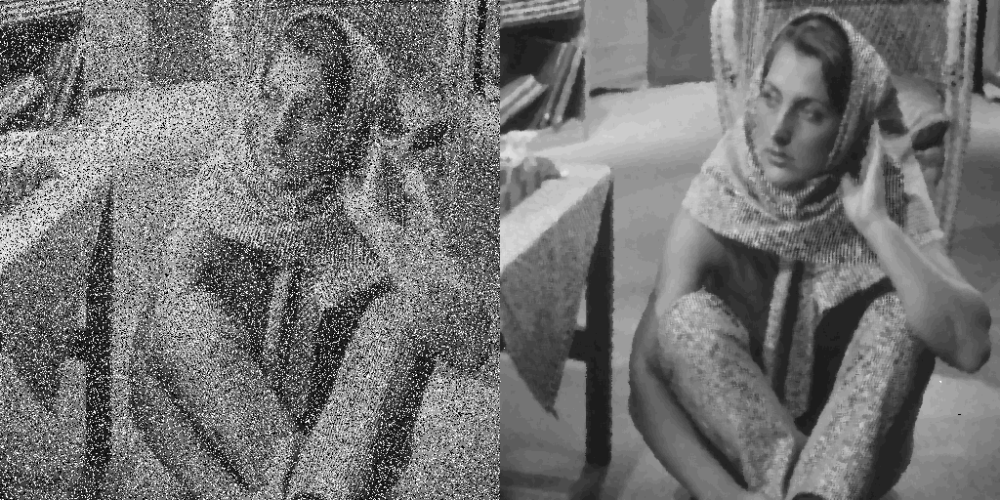

In [0]:
I = cv2.imread('/content/drive/My Drive/Image Processing/salt_noise.png')
median = cv2.medianBlur(I,5)
cv2_imshow(np.hstack([I,median]))

## Edge Detection Filters (Sobel Filter)

(187, 221)
Sobel operator along x
[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]
Sobel operator along y
[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]


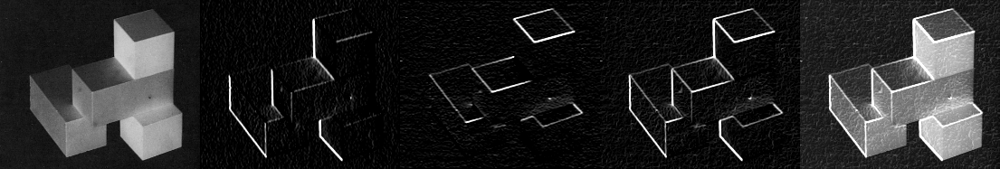

In [0]:
I = cv2.imread('/content/drive/My Drive/Image Processing/cubes.png', cv2.IMREAD_GRAYSCALE)
print (I.shape)

sobel_x = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
print ('Sobel operator along x')
print (sobel_x)
filtered_image1 = cv2.filter2D(I,-1,sobel_x)

sobel_y = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
print ('Sobel operator along y')
print (sobel_y)
filtered_image2 = cv2.filter2D(I,-1,sobel_y)

magnitude = np.sqrt(np.square(filtered_image1.astype('int')) + np.square(filtered_image2.astype('int')))
final = np.clip((I + magnitude),0,255).astype('uint8')
cv2_imshow(np.hstack([I,filtered_image1,filtered_image2, magnitude, final]))

In [212]:
ls

bell.jpg   cubes.png        gamma2.jpg  lotus.jpg       sudoku.jpeg
chair.png  FingerPrint.jpg  j.png       objects.png     text.jpg
coins.jpg  gamma1.jpg       lena.png    salt_noise.png  window.jpeg


## Ex 3: Count the number of windows in image 'window.jpeg'.


In [1]:
I= cv2.imread('./window.jpeg',cv2.IMREAD_GRAYSCALE)
sobel_x= np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
sobel_y= np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
filtered_image1= cv2.filter2D(I,-1,sobel_x)
filtered_image2= cv2.filter2D(I,-1,sobel_y)
magnitude = np.sqrt(np.square(filtered_image1.astype('int'))+np.square(filtered_image2.astype('int')))
final = np.clip((I+magnitude),0,255).astype('uint8')
cv2_imshow(np.hstack([I,filtered_image1,filtered_image2,magnitude,final]))
cv2_imshow(magnitude)
return_histogram(filtered_image1).show()
#126 windows
a,b= filtered_image1.shape
flag=0
count=0
tick=0
I= filtered_image1
ret,thresh1 = cv2.threshold(I,230,255,cv2.THRESH_BINARY)
I = thresh1
cv2_imshow(thresh1)
count=0
I= filtered_image2
ret,thresh2 = cv2.threshold(I,230,255,cv2.THRESH_BINARY)
I = thresh1
cv2_imshow(thresh2)
count1=0
flag=0
for i in range(0,thresh1.shape[1],1):
    if(flag==0 and thresh1[30][i]>230):
      flag=1
      count1+=1
    if(flag==1 and thresh1[30][i]<40):
      flag=0
print(count1)
flag=0
count2=0
for i in range(0,thresh2.shape[0],1):
  if(flag==0 and thresh2[i][10]>230):
    flag=1
    count2+=1
  if(flag==1 and thresh2[i][10]<40):
    flag=0
print(count2)
count1+=1
count2+=1
print("Number of windows are",count1*count2)

NameError: ignored

## Morphological Image Processing

### Erosion and Dilation

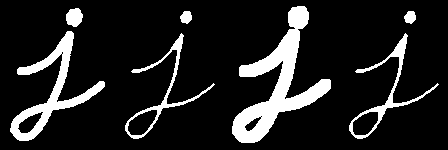

In [12]:
I = cv2.imread('./j.png', cv2.IMREAD_GRAYSCALE)
kernel = np.ones((5,5),np.uint8)
erosion1 = cv2.erode(I,kernel,iterations = 1)
dilation = cv2.dilate(I,kernel,iterations = 1)
erosion2 = cv2.erode(dilation,kernel,iterations = 2)
cv2_imshow(np.hstack([I,erosion1,dilation,erosion2]))

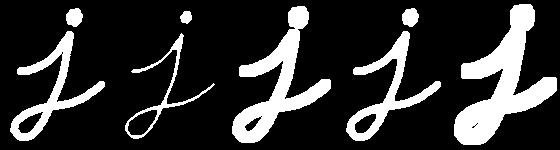

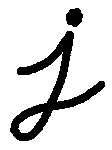

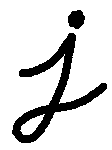

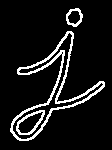

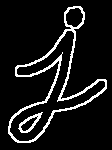

In [40]:
I = cv2.imread('./j.png',cv2.IMREAD_GRAYSCALE)
kernel = np.ones((5,5),np.uint8)
kernel2 = np.zeros((5,5),np.uint8)
erosion1= cv2.erode(I,kernel,iterations=1)
dilation1=cv2.dilate(I,kernel,iterations=1)
erosion2= cv2.erode(dilation1,kernel,iterations=1)
dilation2=cv2.dilate(I,kernel,iterations=2)
cv2_imshow(np.hstack([I,erosion1,dilation1,erosion2,dilation2]))
boundary=I-erosion1
test= cv2.erode(I,kernel2,iterations=1)
cv2_imshow(boundary)
boundary2=dilation1-I
cv2_imshow(boundary2)

### Opening and Closing - Fingerprint Problem

[[1 1 1]
 [1 1 1]
 [1 1 1]]


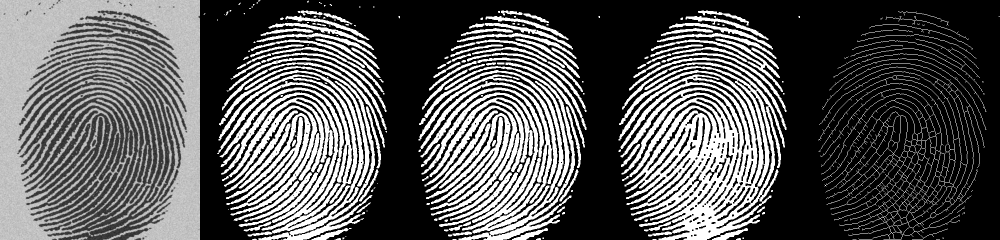

In [31]:
I = cv2.imread('./FingerPrint.jpg', cv2.IMREAD_GRAYSCALE)
ret,binary = cv2.threshold(I,125,255,cv2.THRESH_BINARY_INV)
kernel = np.zeros((5,5),np.uint8)
se = morp.square(3,dtype='uint8')
print (se)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, se)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, se)
closing2 = closing/255
final = morp.medial_axis(closing2)*255
cv2_imshow(np.hstack([I, binary, opening, closing, final]))

In [29]:
ls

aman2.jpeg              coca.jpg            j.png         rose.jpeg
aman3.jpeg              coins.jpg           lena.png      salt_noise.png
aman.jpeg               cubes.png           lotus.jpg     stadium.jpg
bell.jpg                face_alignment.jpg  maggie2.jpg   sudoku.jpeg
boy_smiling.jpg         face.jpg            maggie3.jpeg  text2.png
chair.png               FingerPrint.jpg     maggie.jpg    text.jpg
chroma_img.jpg          gamma1.jpg          objects.png   window.jpeg
chroma_keying_demo.png  gamma2.jpg          overlaid.png


### Ex 4: Write a script which reads 'coin.jpg' as input and outputs a new image containing:

### only the coins touching the boundary of the image

### only the coins which overlap with each other

### only non-overlapping coins

In [0]:
def black(I,x,y,a,b):
  I[x-a:x+a,y-b:y+b]=0
  return I

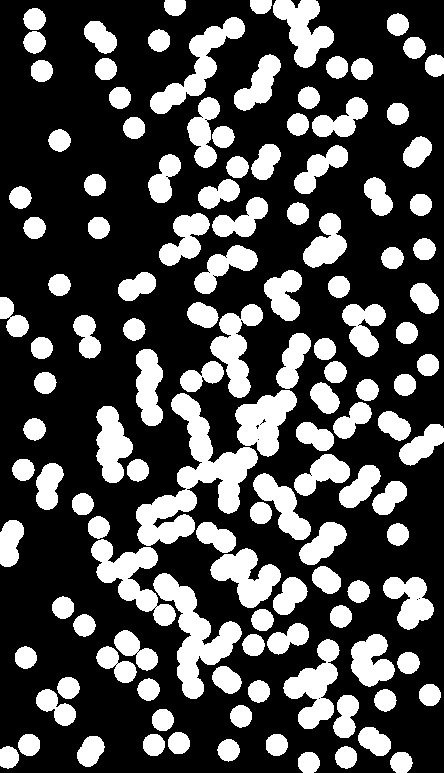

773 444
FINAL COINS


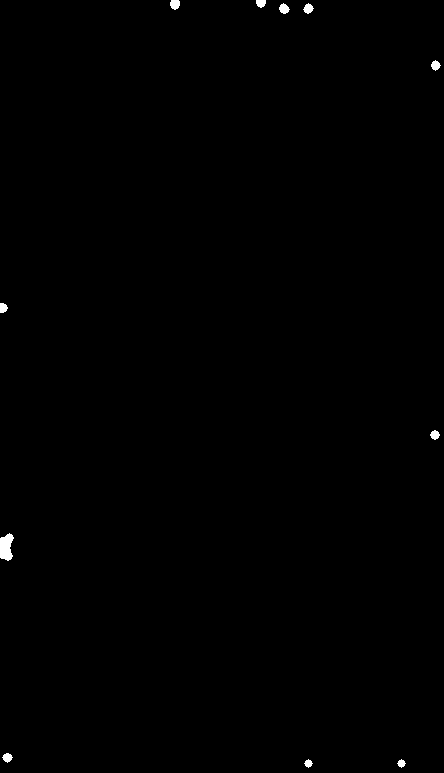

Number of coins touching the boundary = 13 



In [61]:
#first part
I= cv2.imread('./coins.jpg',cv2.IMREAD_GRAYSCALE)

cv2_imshow(I)
a,b=I.shape
print(a,b)
se=morp.disk(10)
a,b=se.shape
erosion=cv2.erode(I,se)
erosion[10:I.shape[0]-10,10:I.shape[1]-10]=0
I=cv2.dilate(erosion,morp.disk(4))
# cv2_imshow(I)
# count=0
q=int(a)
w=int(b)
# I=binary
ret,thresh1 = cv2.threshold(I,120,255,cv2.THRESH_BINARY)
img=thresh1
print("FINAL COINS")
cv2_imshow(img)
count=0
# s=0
# for i in range(img.shape[0]):
#   for j in range(img.shape[1]):
#     s+=1
#     if(img[i][j]>=50):
#       count=count+1
#       x1=i-q
#       if(x1<0):
#         x1=0
#       x2=i+q
#       if(x2>img.shape[0]-1):
#         x1=img.shape[0]-1
#       y1=j-w
#       if(y1<0):
#         y1=0
#       y2=j+w
#       if(y2>img.shape[1]-1):
#         y2=img.shape[1]-1
#       img[x1:x2,y1:y2]=0
#       cv2_imshow(img)
# print(s)
# print(img.shape[0]*img.shape[1])
# cv2_imshow(img)
# print(count)
erosion=img
flag=np.zeros((erosion.shape[0],erosion.shape[1]))
count=0


for i in range(len(erosion)):
  for j in range(len(erosion[i])):
    if erosion[i][j]==255 and i>10 and i< len(erosion)-10 and j>10 and j<len(erosion[i])-10:
      erosion[i][j]=0
    elif erosion[i][j]==255:
      if(flag[i][j]==0):
        count+=1
        for k in range(max(0,i-11),min(len(erosion),i+11)):
          for l in range(max(0,j-11),min(len(erosion[i]),j+11)):
            flag[k][l]=1
print("Number of coins touching the boundary =",count,"\n")
# flag=np.zeros((erosion.shape[0],erosion.shape[1]))
# count=0
# print("HI")
# for i in range(erosion.shape[0]):
#   for j in range(erosion.shape[1]):
#     if(erosion[i][j]==255):
#       if(flag[i][j]==0):
#         count+=1
#         # x1=max(0,i-15)
#         # x2=min()
#         for k in range(max(0,i-200),min(erosion.shape[0]-1,i+200)):
#           for l in range(max(0,j-200),min(erosion.shape[1]-1,j+200)):
#             erosion[k][l]=0
# cv2_imshow(erosion)
# print("Number of coins overlapping =",count,"\n")

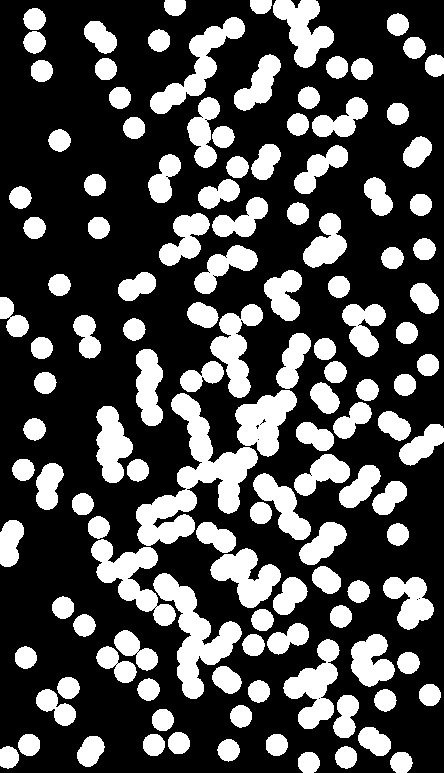

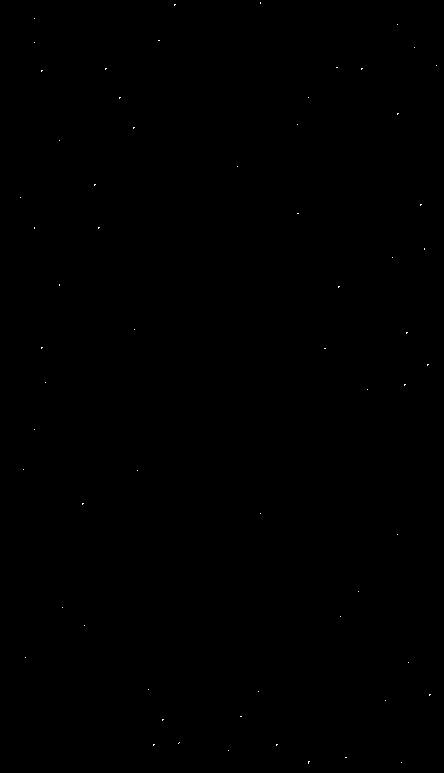

FINAL IMAGE


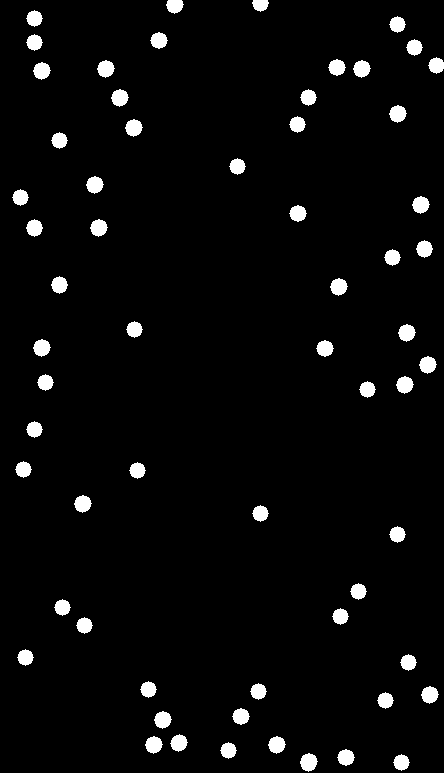

Number of coins overlapping = 186 



In [157]:
#second part
I= cv2.imread('./coins.jpg',cv2.IMREAD_GRAYSCALE)
cv2_imshow(I)
a,b=I.shape
se=np.zeros((25,25))
disk=morp.disk(8)
q,w=disk.shape
q=int(q)
w=int(w)
se[6:6+q,6:6+w]=disk
a,b=se.shape
se[0,:]=-1
se[se.shape[0]-1,:]=-1
se[:,0]=-1
se[:,se.shape[1]-1]=-1
# se[a/2][b/2]=1
x=a/2
y=b/2
x=int(x)
y=int(y)
se[x][y]=1
erosion = I
output_image = cv2.morphologyEx(erosion,cv2.MORPH_HITMISS,se)
cv2_imshow(output_image)
final_image = cv2.dilate(output_image,morp.disk(8))
# cv2_imshow(final_image)
ret,thresh1 = cv2.threshold(final_image,120,255,cv2.THRESH_BINARY)
print("FINAL IMAGE")
cv2_imshow(thresh1)
erosion=thresh1
flag=np.zeros((erosion.shape[0],erosion.shape[1]))
count=0
for i in range(len(erosion)):
  for j in range(len(erosion[i])):
    if erosion[i][j]==255:
      if(flag[i][j]==0):
        count+=1
        for k in range(max(0,i-11),min(len(erosion),i+11)):
          for l in range(max(0,j-11),min(len(erosion[i]),j+11)):
            flag[k][l]=1
print("Number of coins overlapping =",count,"\n")

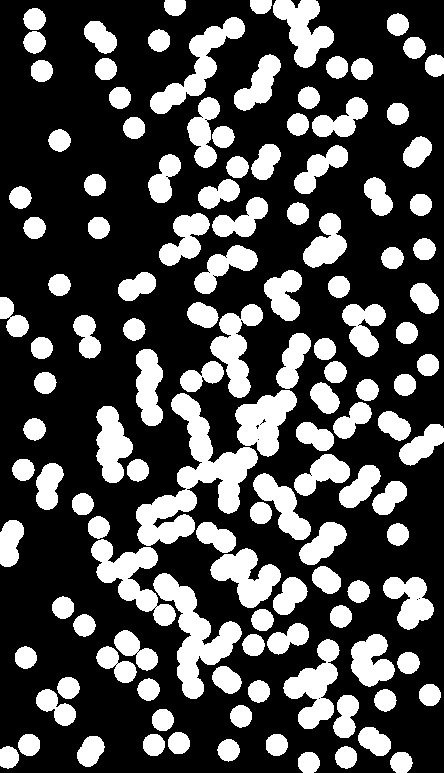

AFTER HIT AND MISS


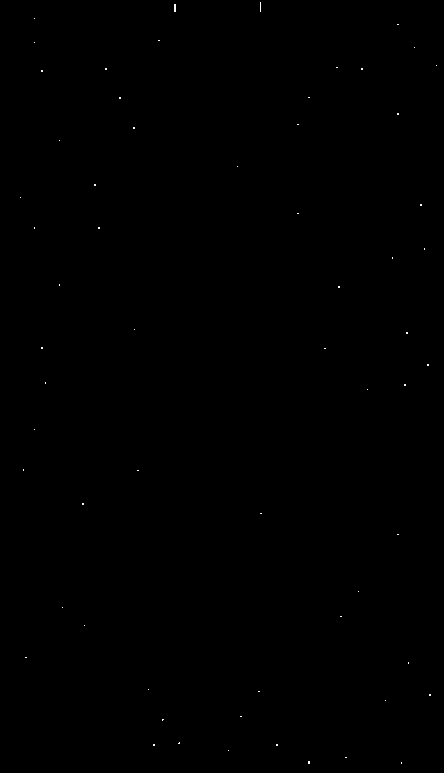

FINAL IMAGE


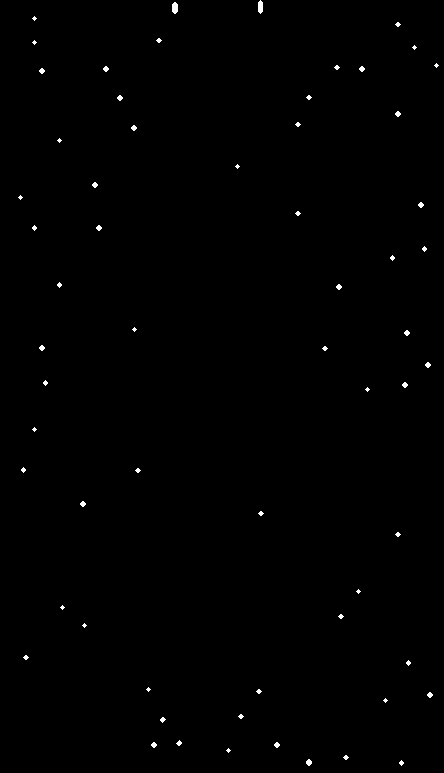

Number of coins non-overlapping = 64 



In [158]:
#third part
I= cv2.imread('./coins.jpg',cv2.IMREAD_GRAYSCALE)
cv2_imshow(I)
a,b=I.shape
se=np.zeros((25,25))
a,b=se.shape
se[0,:]=-1
se[se.shape[0]-1,:]=-1
se[:,0]=-1
se[:,se.shape[1]-1]=-1
# se[a/2][b/2]=1
x=a/2
y=b/2
x=int(x)
y=int(y)
se[x][y]=1
erosion = I
output_image = cv2.morphologyEx(erosion,cv2.MORPH_HITMISS,se)
print("AFTER HIT AND MISS")
cv2_imshow(output_image)
final_image = cv2.dilate(output_image,morp.disk(2))
ret,thresh1 = cv2.threshold(final_image,120,255,cv2.THRESH_BINARY)
print("FINAL IMAGE")
cv2_imshow(thresh1)
erosion=thresh1
flag=np.zeros((erosion.shape[0],erosion.shape[1]))
count=0
for i in range(len(erosion)):
  for j in range(len(erosion[i])):
    if erosion[i][j]==255:
      if(flag[i][j]==0):
        count+=1
        for k in range(max(0,i-11),min(len(erosion),i+11)):
          for l in range(max(0,j-11),min(len(erosion[i]),j+11)):
            flag[k][l]=1
print("Number of coins non-overlapping =",count,"\n")

### HW: Read the image 'objects.png' and try to answer the following questions using code


#### How many objects have one or more holes?
#### How many square objects are in the image?
#### Identify the square objects that have holes.
#### Identify the circular objects that have no holes

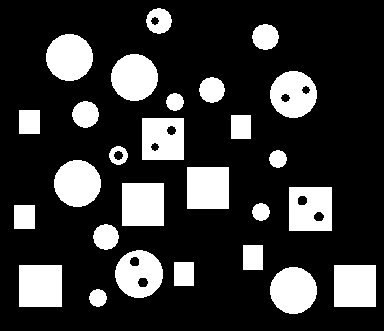

(331, 384)


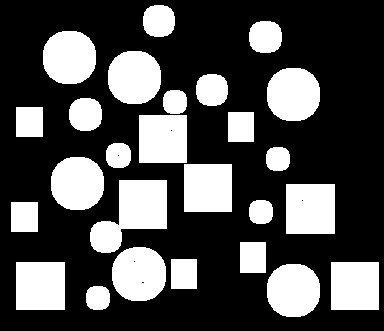

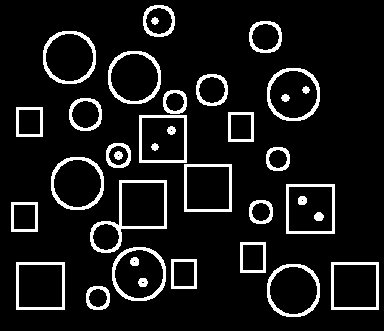

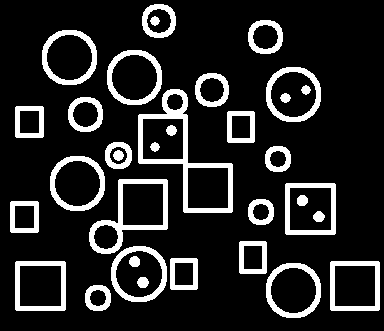

(3, 3)
[[-1. -1. -1. -1. -1. -1. -1. -1.]
 [-1.  0.  0.  0.  0.  0.  0. -1.]
 [-1.  0.  0.  0.  0.  0.  0. -1.]
 [-1.  0.  0.  0.  1.  0.  0. -1.]
 [-1.  0.  0.  1.  1.  1.  0. -1.]
 [-1.  0.  0.  0.  1.  0.  0. -1.]
 [-1.  0.  0.  0.  0.  0.  0. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]]


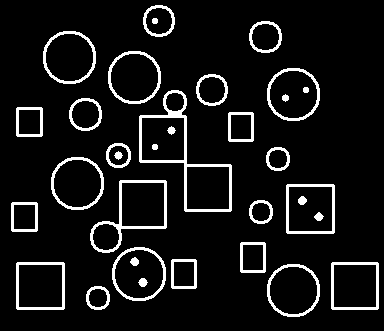

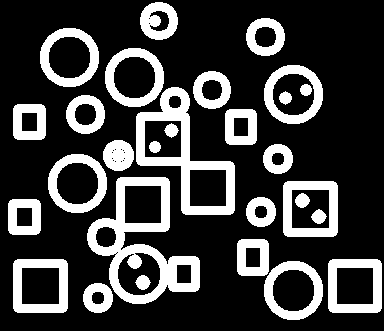

In [121]:
I=cv2.imread('./objects.png',cv2.IMREAD_GRAYSCALE)
cv2_imshow(I)
# ret,thresh1 = cv2.threshold(I,120,255,cv2.THRESH_BINARY)
# I=thresh1
print(I.shape)
se = morp.square(3)
dilate1=cv2.dilate(I,se,iterations=3)
cv2_imshow(dilate1)
final=dilate1-I
cv2_imshow(final)
final=cv2.dilate(final,morp.disk(1))
cv2_imshow(final)
dis = morp.disk(1,dtype='uint8')
print(se.shape)
se2 = np.zeros((8,8))
se2[3:3+dis.shape[0],3:3+dis.shape[1]]=dis
se2[0,:]=-1
se2[:,0]=-1
se2[se2.shape[0]-1,:]=-1
se2[:,se2.shape[1]-1]=-1
print(se2)
output_image = cv2.morphologyEx(final,cv2.MORPH_HITMISS,se)
cv2_imshow(output_image)
final=cv2.dilate(output_image,morp.disk(3))
cv2_imshow(final)


RED


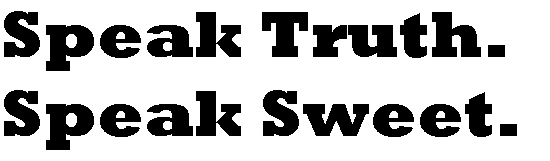

10
BLUE


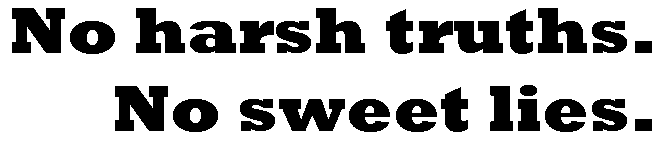

8
GREEN


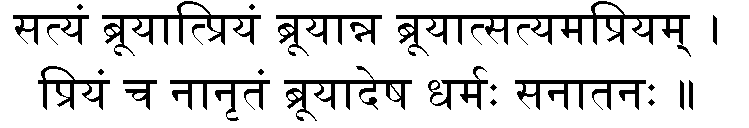

35
BLACK


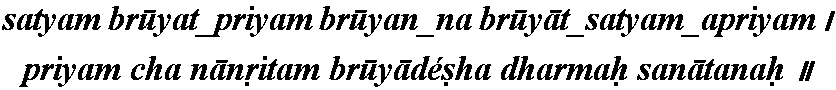

48
PURPLE


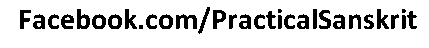

12


In [179]:
#homework for connected
I= cv2.imread('./text2.png')
I1=cv2.imread('./1.PNG',cv2.IMREAD_GRAYSCALE)
I2=cv2.imread('./2.PNG',cv2.IMREAD_GRAYSCALE)
I3=cv2.imread('./3.PNG',cv2.IMREAD_GRAYSCALE)
I4=cv2.imread('./4.PNG',cv2.IMREAD_GRAYSCALE)
I5=cv2.imread('./5.PNG',cv2.IMREAD_GRAYSCALE)
# return_histogram(I2).show()
# return_histogram(I3).show()
# return_histogram(I4).show()
# return_histogram(I5).show()
ret,I1 = cv2.threshold(I1,200,255,cv2.THRESH_BINARY)
T=I1
final1 = cv2.connectedComponents(I1,T,connectivity=4)
print("RED")
cv2_imshow(I1)
print(final1[0])
ret,I2 = cv2.threshold(I2,200,255,cv2.THRESH_BINARY)
T=I2
final2 = cv2.connectedComponents(I2,T,connectivity=4)
print("BLUE")
cv2_imshow(I2)
print(final2[0])
ret,I3 = cv2.threshold(I3,200,255,cv2.THRESH_BINARY)
T=I3
final3 = cv2.connectedComponents(I3,T,connectivity=4)
print("GREEN")
cv2_imshow(I3)
print(final3[0])
ret,I4 = cv2.threshold(I4,200,255,cv2.THRESH_BINARY)
T=I4
final4 = cv2.connectedComponents(I4,T,connectivity=4)
print("BLACK")
cv2_imshow(I4)
print(final4[0])
ret,I5 = cv2.threshold(I5,200,255,cv2.THRESH_BINARY)
T=I5
final5 = cv2.connectedComponents(I5,T,connectivity=4)
print("PURPLE")
cv2_imshow(I5)
print(final5[0])

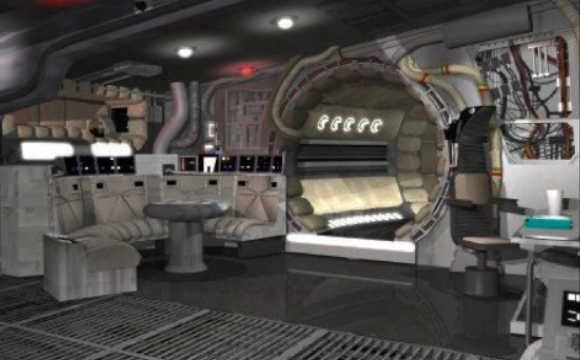

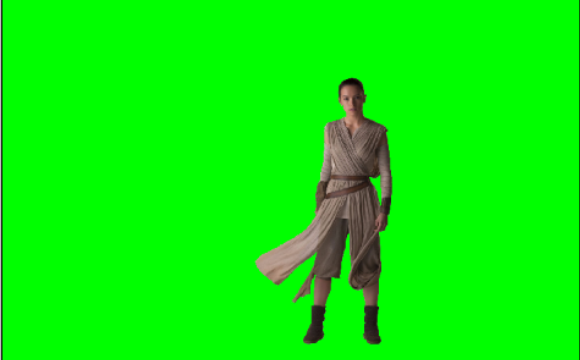

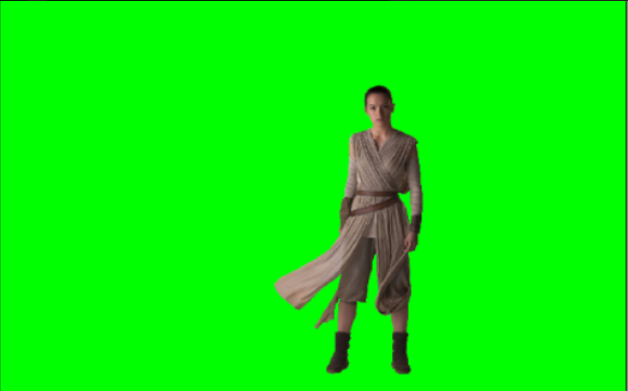

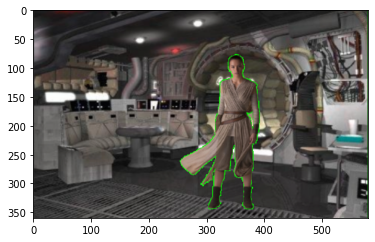

In [184]:

image = cv2.imread('./star.PNG')
img = cv2.imread('./chroma_keying_demo.png')
a,b,c=img.shape
q=int(b/3)
first=img[:,0:q,:]
second=img[:,q:2*q,:]
cv2_imshow(first)
cv2_imshow(second)
cv2_imshow(image)
image=second
image_copy = np.copy(image)
image_copy = cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)
plt.imshow(image_copy)
lower_blue = np.array([0, 100, 0])     ##[R value, G value, B value]
upper_blue = np.array([0, 255, 0]) 
mask = cv2.inRange(image_copy, lower_blue, upper_blue)
plt.imshow(mask, cmap='gray')
masked_image = np.copy(image_copy)
masked_image[mask != 0] = [0, 0, 0]
plt.imshow(masked_image)
background_image = first
background_image = cv2.cvtColor(background_image, cv2.COLOR_BGR2RGB)
# plt.imshow(background_image)
crop_background = background_image[0:720, 0:1280]

crop_background[mask == 0] = [0, 0, 0]

plt.imshow(crop_background)

final_image = crop_background + masked_image
plt.imshow(final_image)


In [189]:
I = cv2.imread('./boy_smiling.jpg')
im_rgb =  cv2.cvtColor(I, cv2.COLOR_BGR2RGB)
h,w,c= im_rgb.shape
T = np.float32([[1,0,w/4],[0,1,h/4]])
print(T)

[[  1.    0.  100. ]
 [  0.    1.   98.5]]


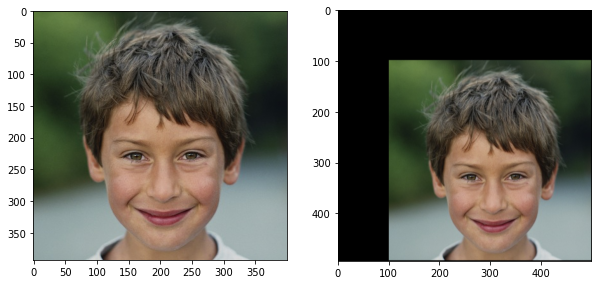

In [192]:
img_trans = cv2.warpAffine(im_rgb,T,(w+100,h+100))
fig, (ax1,ax2)= plt.subplots(1,2,figsize=[10,10])
ax1.imshow(im_rgb)
ax2.imshow(img_trans)
plt.show()


Rotation matrix about center
[[  0.70710678   0.70710678 -80.72139213]
 [ -0.70710678   0.70710678 199.12132034]]
Rotation matrix about origin
[[ 0.70710678  0.70710678  0.        ]
 [-0.70710678  0.70710678  0.        ]]


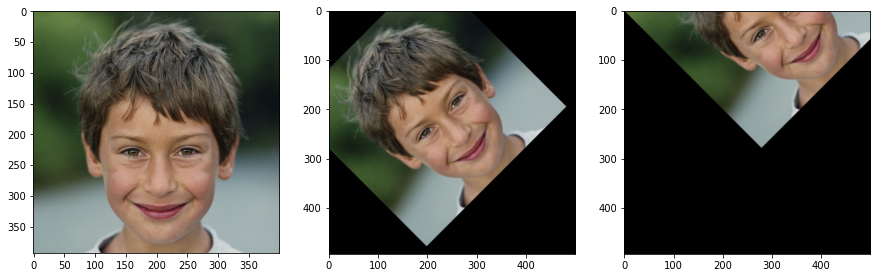

In [195]:
M1 = cv2.getRotationMatrix2D((w/2,h/2),45,1)
M2 = cv2.getRotationMatrix2D((0,0),45,1)
print("Rotation matrix about center")
print(M1)
print("Rotation matrix about origin")
print(M2)
img1= cv2.warpAffine(im_rgb,M1,(w+100,h+100))
img2=cv2.warpAffine(im_rgb,M2,(w+100,h+100))
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=[15,15])
ax1.imshow(im_rgb)
ax2.imshow(img1)
ax3.imshow(img2)
plt.show()

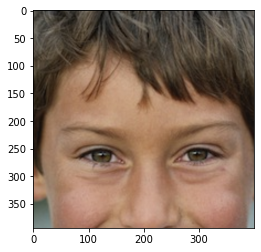

In [196]:
M1 = cv2.getRotationMatrix2D((w/2,h/2),0,2)
# M2 = cv2.getRotationMatrix2D((0,0),45,1)
# print("Rotation matrix about center")
# print(M1)
# print("Rotation matrix about origin")
# print(M2)
img1= cv2.warpAffine(im_rgb,M1,(w,h))
# img2=cv2.warpAffine(im_rgb,M2,(w+100,h+100))
# fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=[15,15])
# ax1.imshow(im_rgb)
# ax2.imshow(img1)
# ax3.imshow(img2)
plt.imshow(img1)

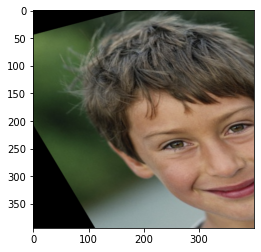

In [197]:
pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])

M = cv2.getAffineTransform(pts1,pts2)
im_affine= cv2.warpAffine(im_rgb,M,(w,h))
plt.imshow(im_affine)

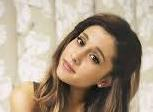

(112, 153, 3)


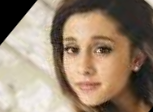

In [223]:
#w2b girl face tilted straight
import math
img=cv2.imread('./tilted_face.jpg')
cv2_imshow(img)
print(img.shape)
#tilt the image
a,b,c=img.shape
p1=np.float32([94, 58]) 
p2=np.float32([80, 41])
p3=p1-p2
theta=math.degrees(math.atan(p3[1]/p3[0]))
M1 = cv2.getRotationMatrix2D((87,50),theta,1.4)
im_affine= cv2.warpAffine(img,M1,(b,a))
cv2_imshow(im_affine)


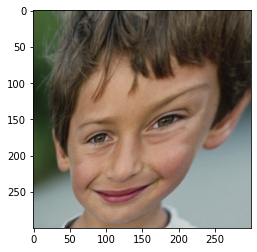

In [227]:
pts1 = np.float32([[50,50],[300,150],[25,387],[389,390]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])
M = cv2.getPerspectiveTransform(pts1,pts2)
im_affine= cv2.warpPerspective(im_rgb,M,(300,300))
plt.imshow(im_affine)

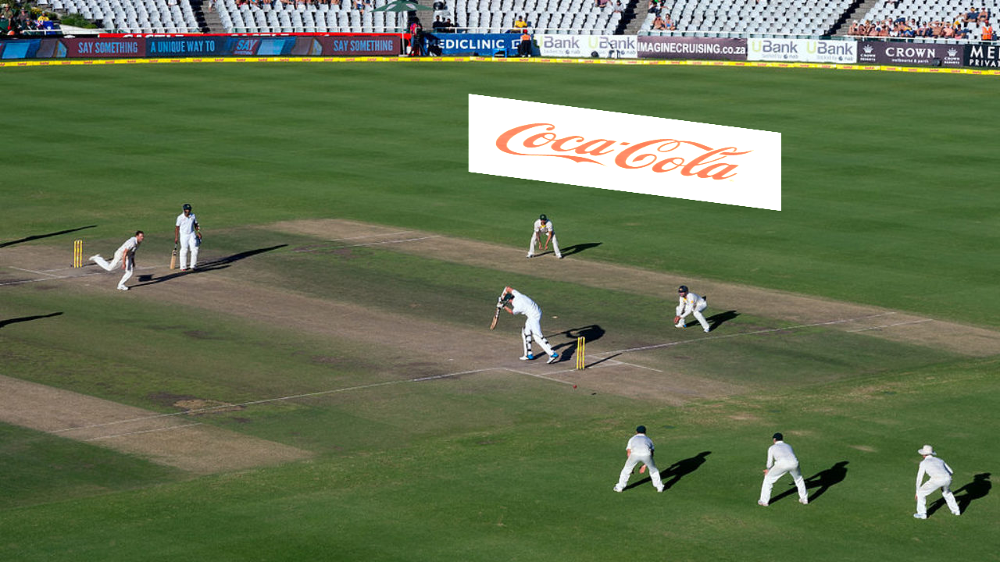

In [250]:
first=cv2.imread('./coca.jpg')
second=cv2.imread('./stadium.jpg')
third=cv2.imread('./overlaid.png')
pts1 = np.float32([[0,0],[0,179],[320, 0],[320,179]]) # cola coords
pts2 = np.float32([[600,120],[600, 220],[1000, 170],[1000, 270]]) # stadium tile coords
M = cv2.getPerspectiveTransform(pts1,pts2)
im_affine= cv2.warpPerspective(first,M,(second.shape[1],second.shape[0]))
final=cv2.add(second,im_affine)
cv2_imshow(final)